In [2]:
from scipy import signal
import cv2
import numpy as np 
import os 
import matplotlib.pyplot as plt

# Optical Flow Algorithm

In [4]:
def optical_flow(I1g, I2g, window_size, tau=1e-2):
#     Define our kernels to calculate gradients
    kernel_x = np.array([[-1., 1.], [-1., 1.]])
    kernel_y = np.array([[-1., -1.], [1., 1.]])
    kernel_t = np.array([[1., 1.], [1., 1.]])#*.25
    w = window_size//2 # window_size is odd, all the pixels with offset in between [-w, w] are inside the window
    I1g = I1g / 255. # normalize pixels
    I2g = I2g / 255. # normalize pixels
    # Implement Lucas Kanade
    # for each point, calculate I_x, I_y, I_t by conv2d
    fx = signal.convolve2d(I1g, kernel_x, boundary='symm', mode='same')
    fy = signal.convolve2d(I1g, kernel_y, boundary='symm', mode='same')
    ft = signal.convolve2d(I2g, kernel_t, boundary='symm', mode='same') + \
        signal.convolve2d(I1g, -kernel_t, boundary='symm', mode='same')
    u = np.zeros(I1g.shape)
    v = np.zeros(I1g.shape)
    
    # For each window calculate the vectors [u,v]    
    # within windw window_size * window_size
    for i in range(w, I1g.shape[0]-w):
        for j in range(w, I1g.shape[1]-w):
            Ix = fx[i-w:i+w+1, j-w:j+w+1].flatten()
            Iy = fy[i-w:i+w+1, j-w:j+w+1].flatten()
            It = ft[i-w:i+w+1, j-w:j+w+1].flatten()
            
            A = [ [ np.sum(Ix*Ix),np.sum(Ix*Iy)], [np.sum(Iy*Ix), np.sum(Iy*Iy)] ]
            A = np.array(A)
    
            b = [-np.sum(Ix*It), -np.sum(Iy*It)]
            b = np.array(b)
            
            # if threshold τ is larger than the smallest eigenvalue of A'A:
            U,D,V_T = np.linalg.svd(A.T.dot(A))
            if np.min(D) < tau:
                u[i,j]=0
                v[i,j]=0                
            
            else:
                try:
                    nu = np.linalg.inv(A).dot(b)
                    u[i,j]=nu[0]
                    v[i,j]=nu[1]
                except Exception as e:
                    print(A,D,e)
                
    return [u,v]


In [5]:
def display_opticalflow_results(im1,im2,u,v,fig_size=(16,16),arrow_thres=0.02):

    fig = plt.figure(figsize=fig_size)
    
    #     Images
    ax = fig.add_subplot(3,2,1)
    ax.imshow(im1,cmap='gray')
    ax.set_title("Image T:1")
    ax.axis('off')
    
    ax = fig.add_subplot(3,2,2)
    ax.imshow(im2,cmap='gray')
    ax.set_title("Image T:2")
    ax.axis('off')
    
    # Vectors     
    ax = fig.add_subplot(3,2,3)
    ax.imshow(u,cmap='gray')
    ax.set_title("U")
    ax.axis('off')
    
    ax = fig.add_subplot(3,2,4)
    ax.imshow(v,cmap='gray')
    ax.set_title("V")
    ax.axis('off')
    
    # Magnitude     
    ax = fig.add_subplot(3,2,5)
    ax.imshow(u*u + v*v,cmap='gray')
    ax.set_title("U^2 + V^2")
    ax.axis('off')
    
    # Angle
    ax = fig.add_subplot(3,2,6)
    ax.imshow(np.arctan2(v,u),cmap='gray')
    ax.set_title("arc(v/u)")
    ax.axis('off')

    fig = plt.figure(figsize=fig_size)
    ax = fig.add_subplot(1,2,1)
    ax.imshow(im1,cmap='gray')
    ax.set_title("Optical flow Arrows")
    
#     arrow_ind_y,arrow_ind_x = np.where(u*u + v*v > arrow_thres)
    kp = cv2.goodFeaturesToTrack(im1, 100, 0.01, 10, 3)
    for arrow_ind in kp:
        x,y = arrow_ind[0]
        y = int(y)
        x = int(x)
        ax.arrow(x,y,u[y,x],v[y,x],head_width = 1, head_length = 5, color = (0,1,0))
        
    ax = fig.add_subplot(1,2,2)
    ax.imshow( (u*u + v*v>arrow_thres),cmap='gray')
    ax.set_title("Optical flow Mask")
    
    ax.axis('off')
   

    plt.show()
    
    return None

In [6]:
img_dir ='./eval-data-gray/'

img_pair_list = []
img_pair_list = []
for dirname in os.listdir(img_dir):
    if os.path.isdir(os.path.join(img_dir,dirname)):
        im1_path,im2_path = os.listdir(os.path.join(img_dir,dirname))

        im1 = cv2.imread(os.path.join(img_dir,dirname,im1_path),0)
        im2 = cv2.imread(os.path.join(img_dir,dirname,im2_path),0)
        img_pair_list.append([im1,im2])
    else:
        print("File if not a dir",dirname)


File if not a dir .DS_Store


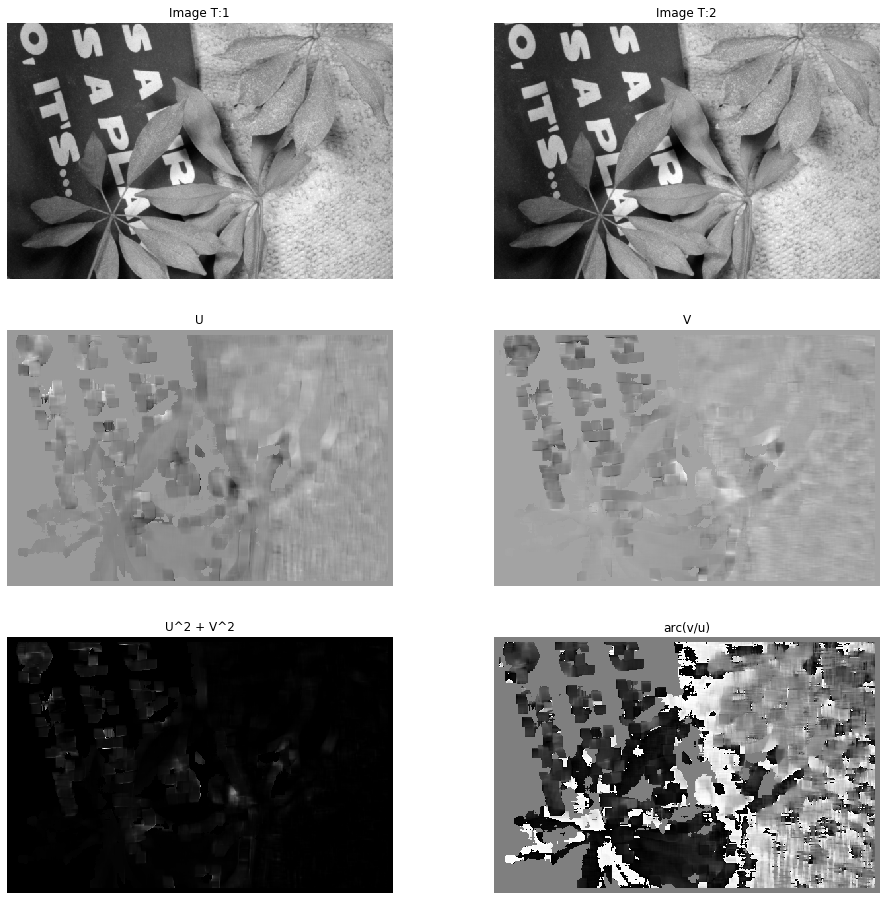

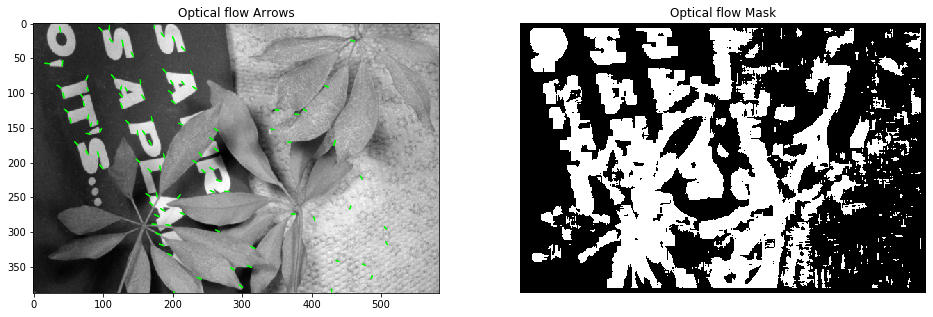

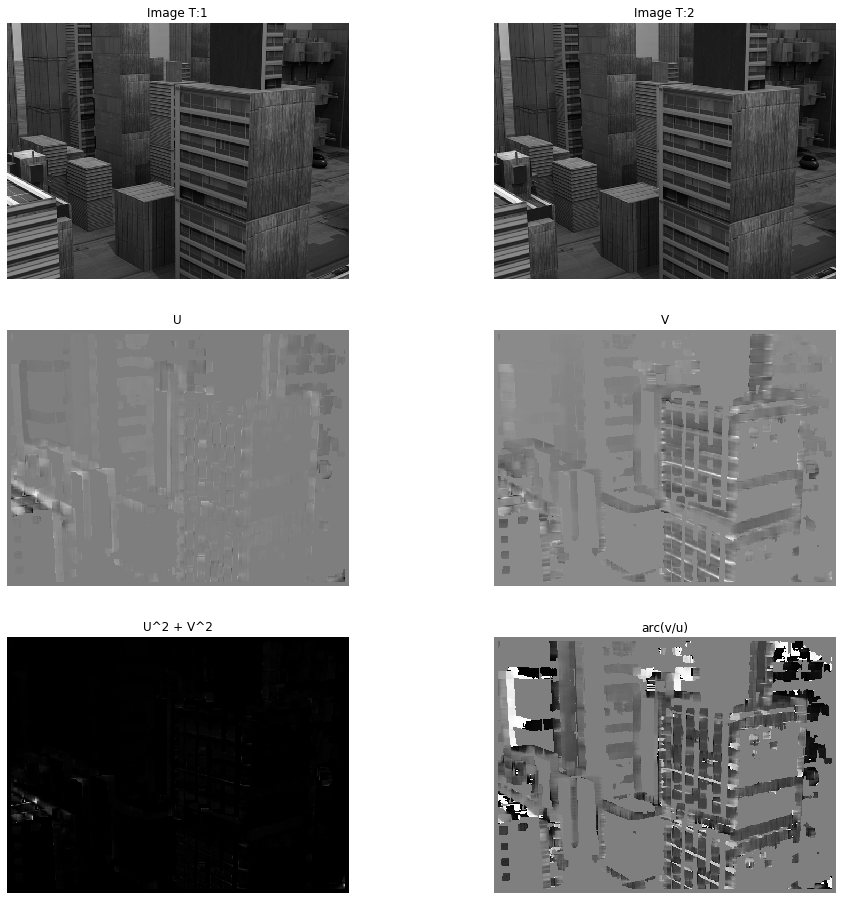

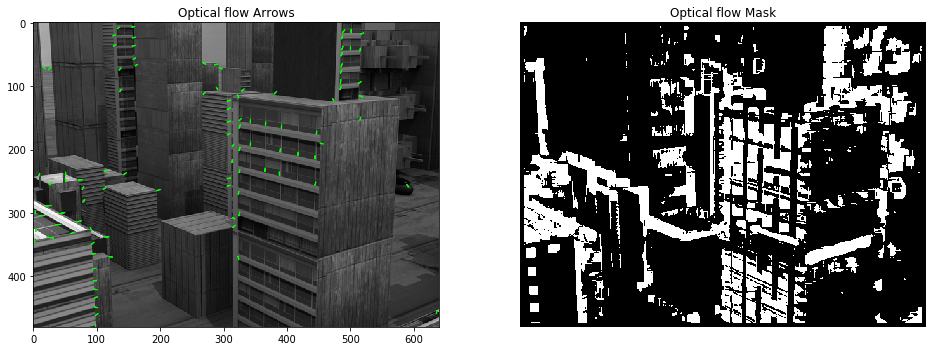

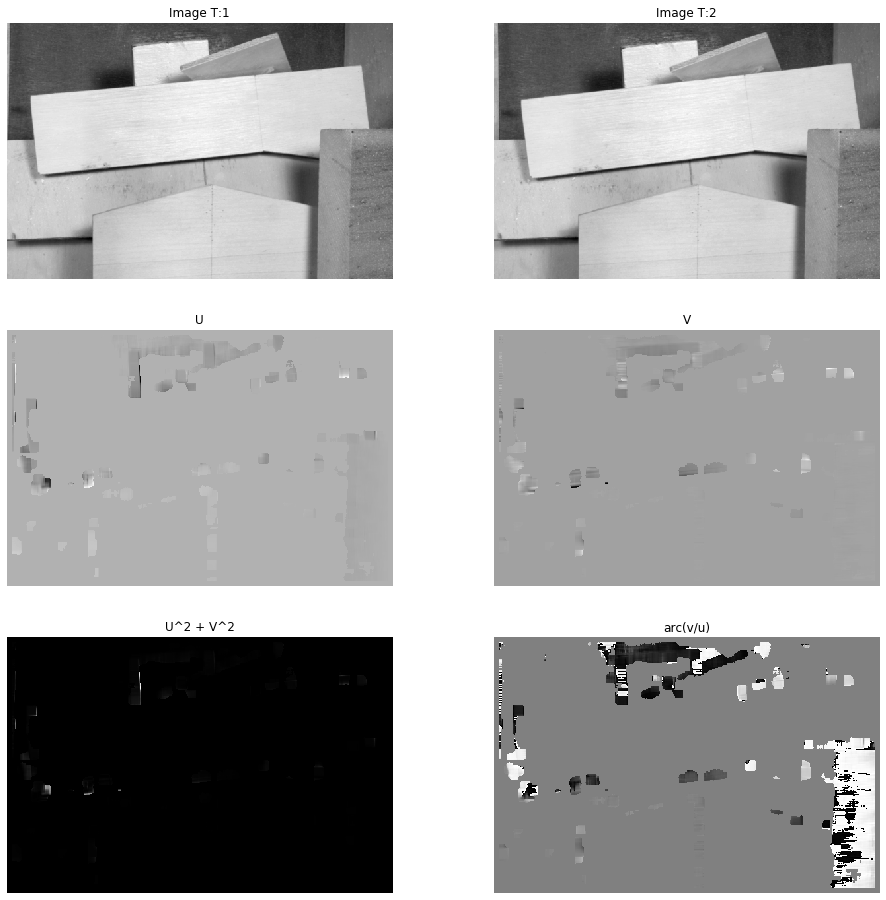

...

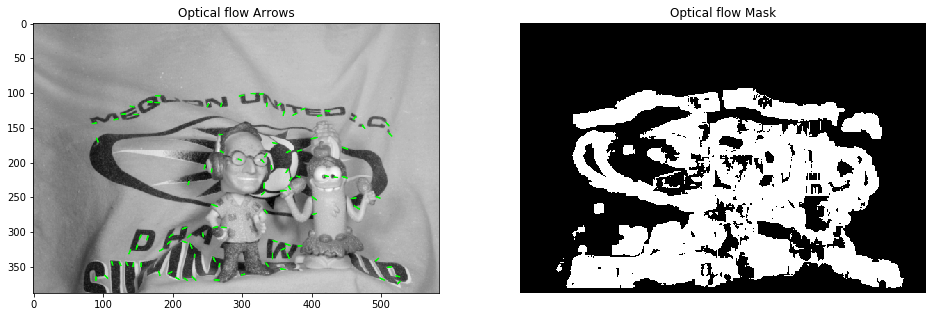

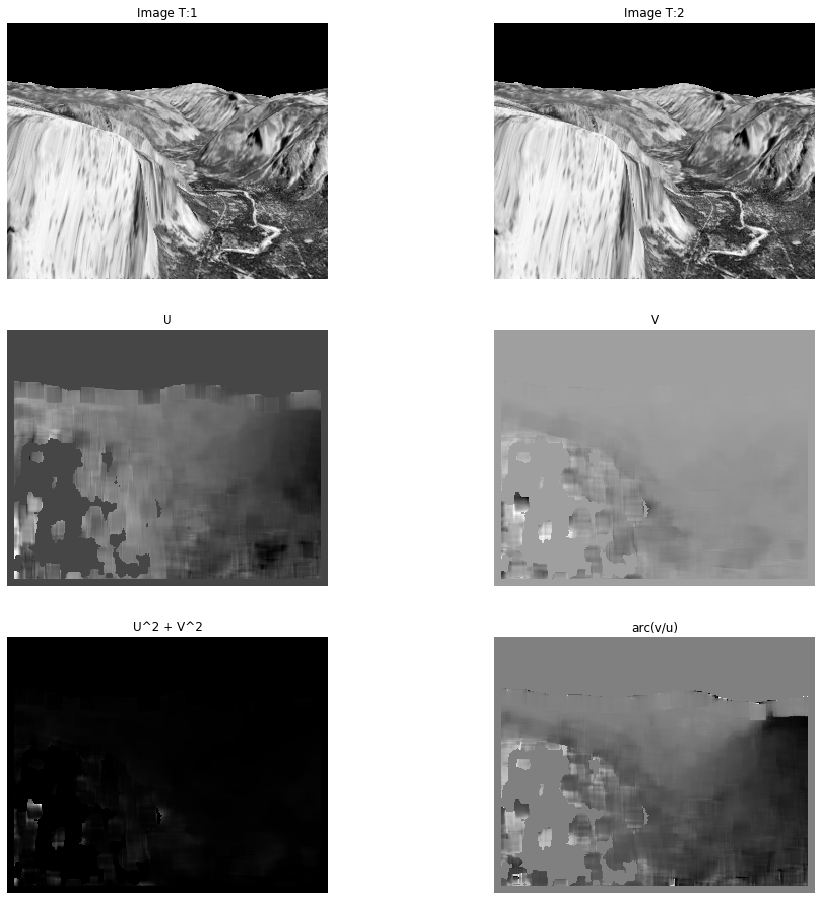

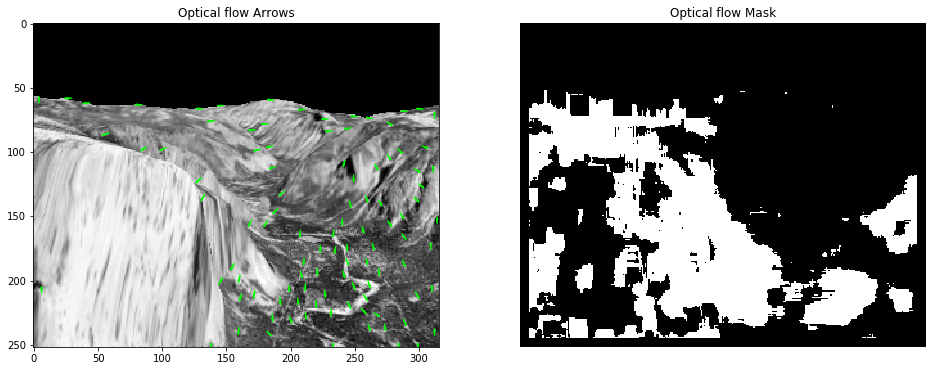

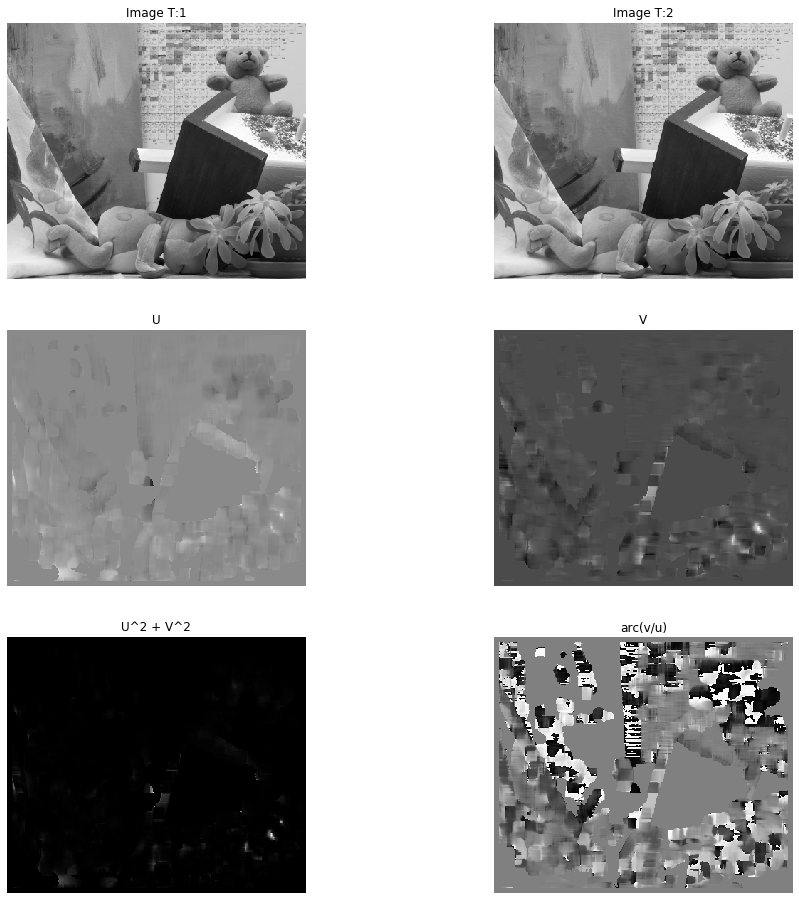

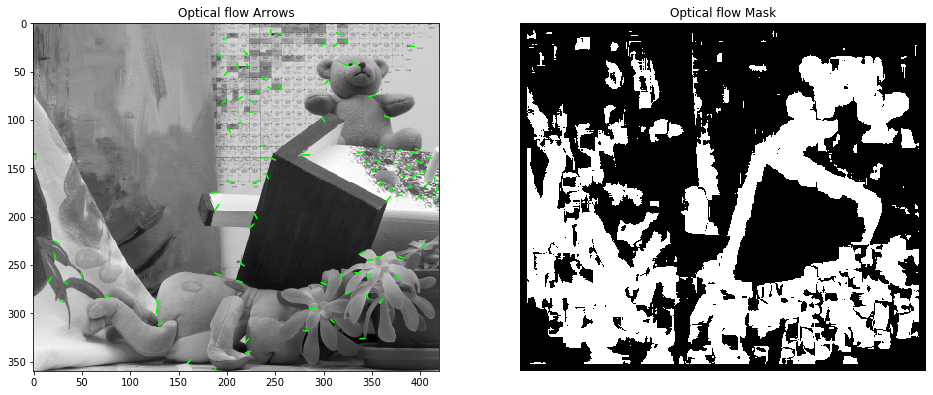

In [19]:
# Calculate optical flow on images
cnt = 0
for image_pair in img_pair_list:
    cnt +=1 
    im1,im2 = image_pair
    u,v = optical_flow(im1,im2,window_size=15)
    display_opticalflow_results(im1,im2,u,v,arrow_thres=1)

# Object Segmentation and Tracking  

In [ ]:
#Converting Video into Images 
def Video_to_Images(video_path,frame_rate):
    video = cv2.VideoCapture(video_path)
    has_frame, frame1 = video.read()
    gray1 = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
    hsv = np.zeros_like(gray1)
    arrow_thres=0.02
    
#     hsv[...,1] = 255
    
    count = 1
    sec = 0
    while(1):
#         video.set(cv2.CAP_PROP_POS_MSEC,sec*1000)
        has_frame, frame2 = video.read()
        gray2 = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)
        
        u,v = optical_flow(gray1,gray2,window_size=15)
        frame_ = np.zeros_like(gray1)
        mask = u*u + v*v>arrow_thres
        frame_[mask] = gray1[mask]
        cv2.imwrite("output_vid2img/image"+str(count)+".jpg",frame_)
        count = count+1
        sec = sec + frame_rate
        sec = round(sec,2)
        
        gray1 = gray2
        
#         else:
#             break
            
video_path = './Video.mp4'            
Video_to_Images(video_path,30) 



In [36]:
def Video_to_Images(video_path,frame_rate):
    video = cv2.VideoCapture(video_path)
    count = 1
    sec = 0
    while(video.isOpened()):
        video.set(cv2.CAP_PROP_POS_MSEC,sec*1000)
        has_frame, frame = video.read()
        if(has_frame != 0):
            cv2.imwrite("org_vid2img/image"+str(count)+".jpg",frame)
            count = count+1
            sec = sec + frame_rate
            sec = round(sec,2)
        else:
            break
            
video_path = './Video.mp4'            
Video_to_Images(video_path,30) 

In [8]:
#Converting Images into Video 
frames = []
def Images_to_Video(img_path,list_img,frame_rate,frames,vid_path):
    for i in range(len(list_img)):
        p = os.path.join(img_path,list_img[i])
        frame = cv2.imread(p)
        h,w,c = frame.shape
        frame_size = (w,h)
        frames.append(frame)
        
    out = cv2.VideoWriter(vid_path,cv2.VideoWriter_fourcc(*'mp4v'), frame_rate, frame_size)
        
    for i in range(len(frames)):
        out.write(frames[i])
    out.release()    
    
img_path = 'output_vid2img/'
vid_path = './output_img2vid.mp4'
list_imag = os.listdir(img_path)
list_f=[]
list_sec = []
final_list = []

for i in list_imag:
    if len(i)!=10:
        list_sec.append(i)
    else:
        list_f.append(i)

list_f.sort()        
list_sec.sort()
list_f.extend(list_sec)


frame_rate = 15

Images_to_Video(img_path,list_f,frame_rate,frames,vid_path)    

# Optical Masks for each frame of a video

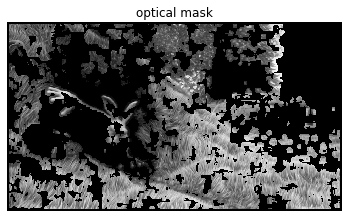

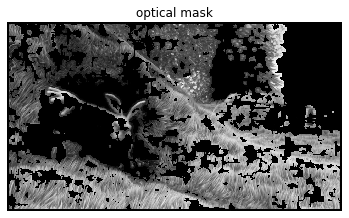

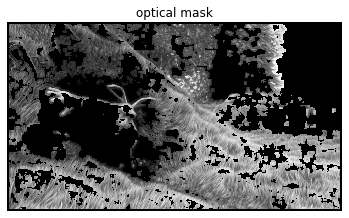

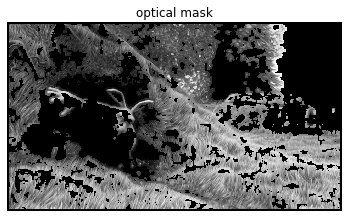

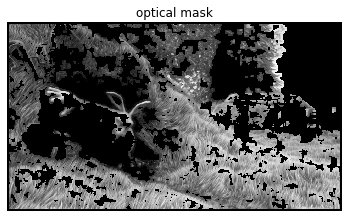

...

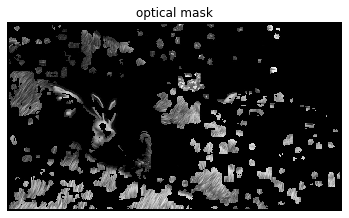

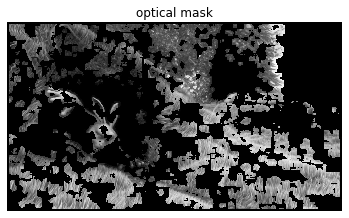

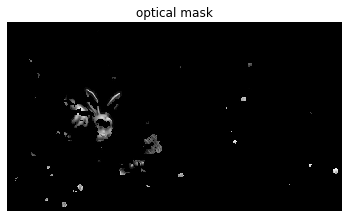

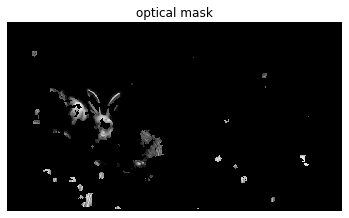

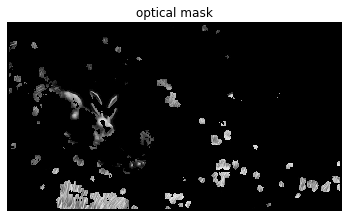

In [39]:
img_dir = './output_vid2img/'
for dirname in os.listdir(img_dir):
    fpath= os.path.join(img_dir,dirname)
    img = cv2.imread(fpath,0)
    plt.figure()
    plt.imshow(img,cmap='gray')
    plt.title('optical mask')
    plt.axis('off')

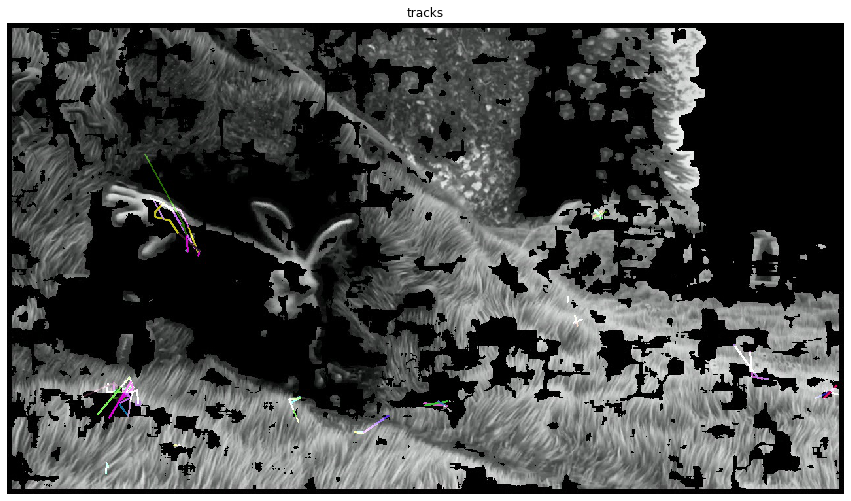

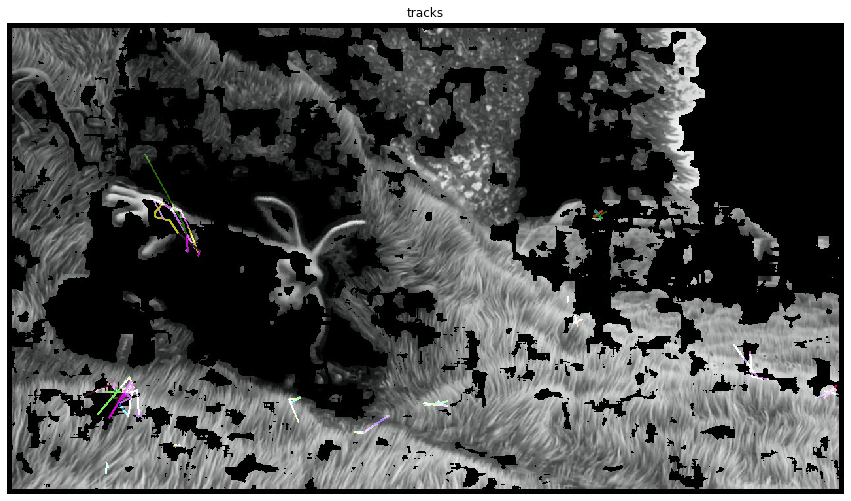

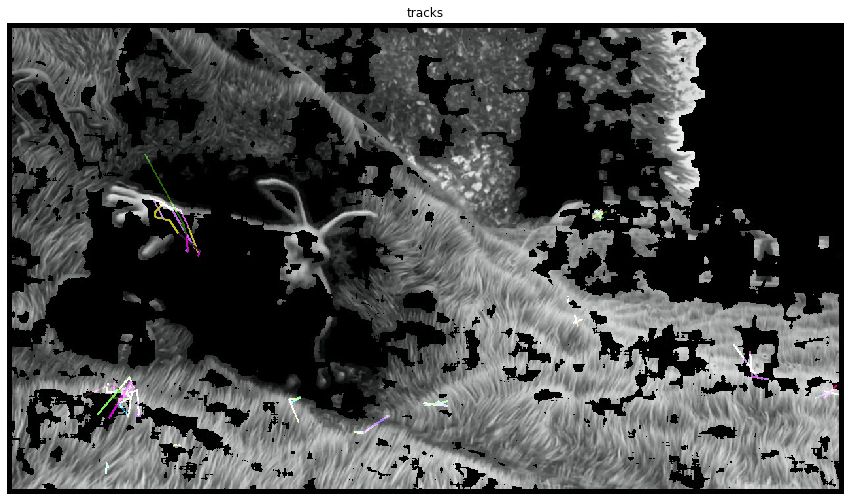

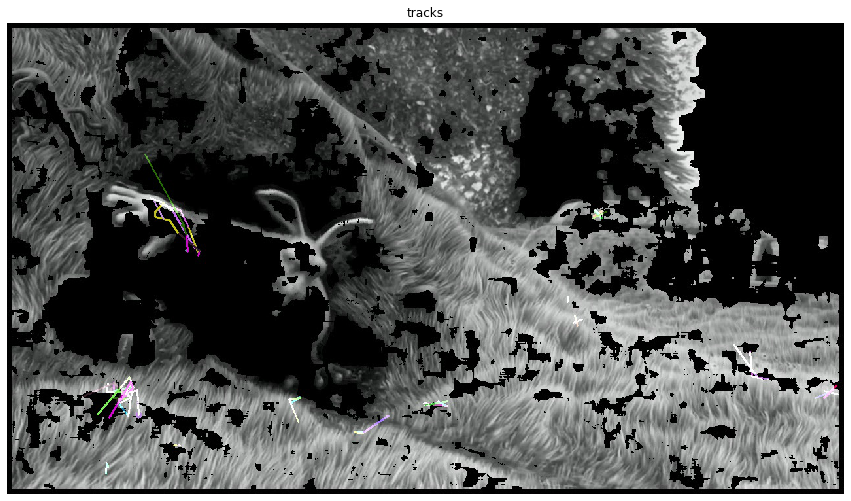

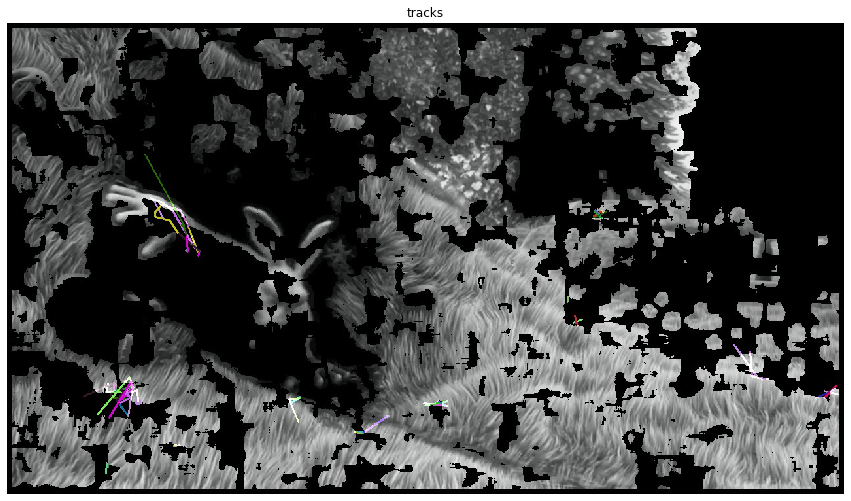

...

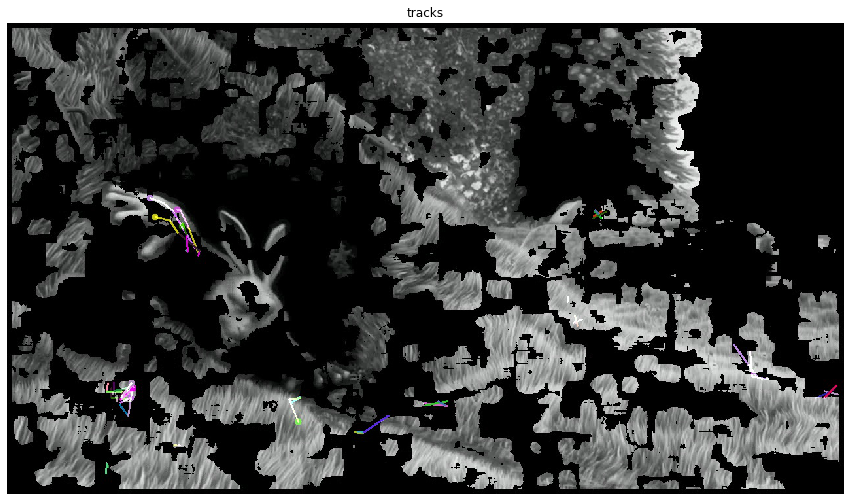

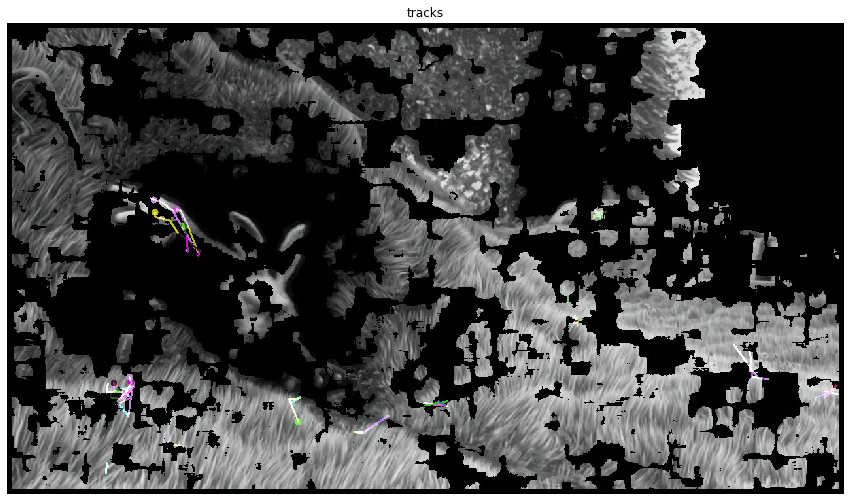

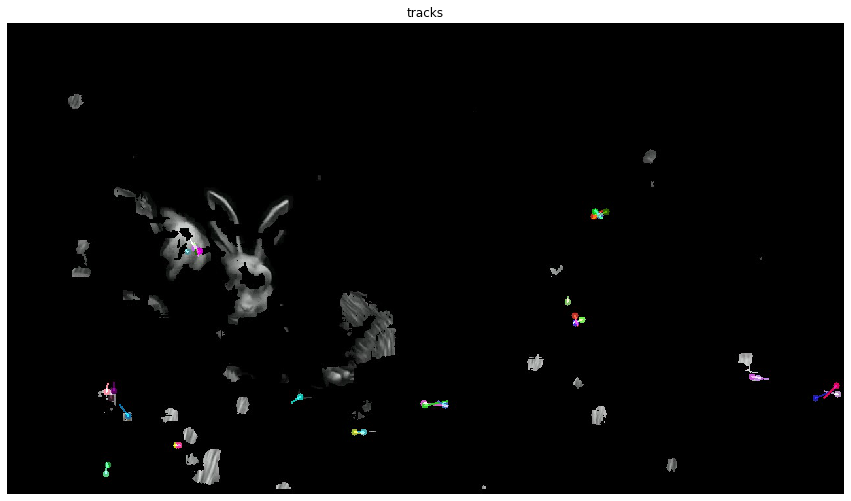

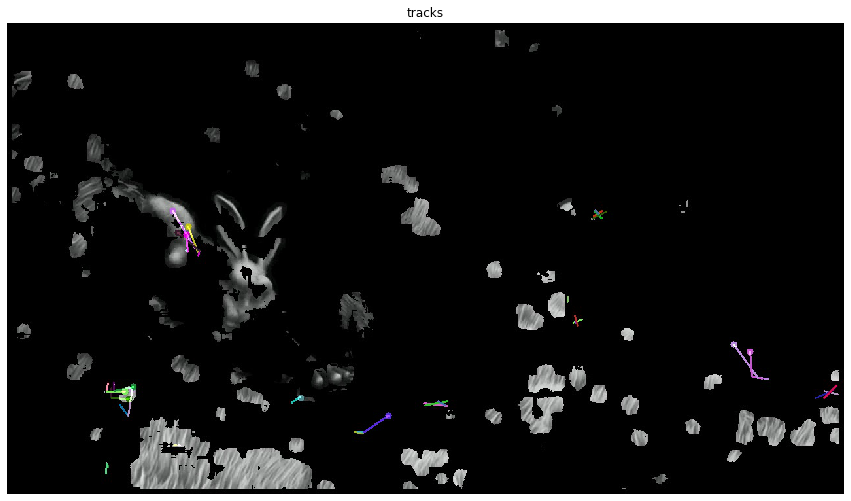

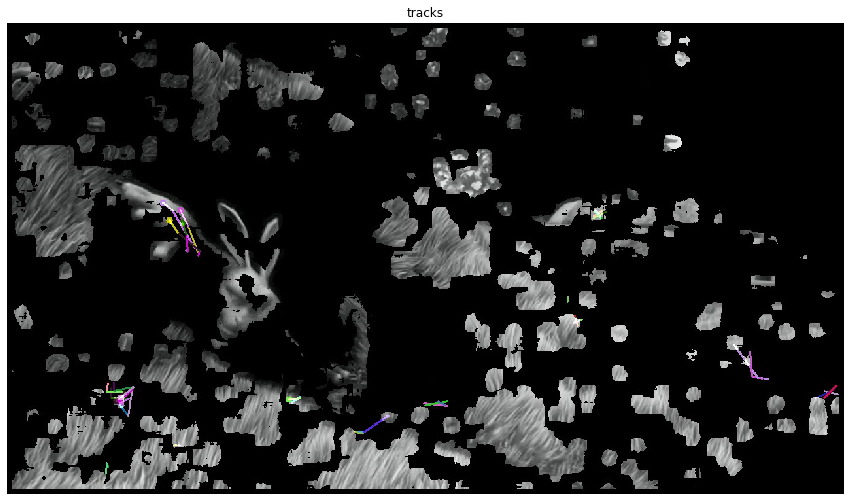

In [38]:
cap = cv2.VideoCapture('./output_img2vid.mp4')

# params for ShiTomasi corner detection
feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

# Parameters for lucas kanade optical flow
lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Create some random colors
color = np.random.randint(0,255,(100,3))

# Take first frame and find corners in it
ret, old_frame = cap.read()
# old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)

old_gray = old_frame
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

# Create a mask image for drawing purposes
mask = np.zeros_like(old_frame)
count = 0
while(1):
    ret,frame = cap.read()
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # calculate optical flow
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    # Select good points
    good_new = p1[st==1]
    good_old = p0[st==1]

    # draw the tracks
    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (a,b),(c,d), color[i].tolist(), 2)
        frame = cv2.circle(frame,(a,b),5,color[i].tolist(),-1)
    img = cv2.add(frame,mask)

#     cv2.imshow('frame',img)
    count+=1
    cv2.imwrite("./tracks_r/image"+str(count)+".jpg",img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

    # Now update the previous frame and previous points
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

cv2.destroyAllWindows()
cap.release()

img_dir = './tracks_r/'
for dirname in os.listdir(img_dir):
    fpath= os.path.join(img_dir,dirname)
    img = cv2.imread(fpath)
    plt.figure(figsize=(15,15))
    plt.imshow(img)
    plt.title('tracks')
    plt.axis('off')

# Own Experiments on a Video of a rolling ball

In [ ]:
def Video_to_Images(video_path,frame_rate):
    video = cv2.VideoCapture(video_path)
    has_frame, frame1 = video.read()
    gray1 = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
    hsv = np.zeros_like(gray1)
    arrow_thres=0.02
    
#     hsv[...,1] = 255
    
    count = 1
    sec = 0
    while(1):
#         video.set(cv2.CAP_PROP_POS_MSEC,sec*1000)
        has_frame, frame2 = video.read()
        gray2 = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)
        
        u,v = optical_flow(gray1,gray2,window_size=15)
        frame_ = np.zeros_like(gray1)
        mask = u*u + v*v>arrow_thres
        frame_[mask] = gray1[mask]
        cv2.imwrite("ball_vid2img/image"+str(count)+".jpg",frame_)
        count = count+1
        sec = sec + frame_rate
        sec = round(sec,2)
        
        gray1 = gray2
        
#         else:
#             break
            
video_path = './ball2.mp4'            
Video_to_Images(video_path,30)   

In [44]:
def Video_to_Images(video_path,frame_rate):
    video = cv2.VideoCapture(video_path)
    has_frame, frame1 = video.read()
    gray1 = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
    hsv = np.zeros_like(gray1)
    arrow_thres=0.02
    
    count = 1
    sec = 0
    while(1):
#         video.set(cv2.CAP_PROP_POS_MSEC,sec*1000)
        has_frame, frame2 = video.read()
        cv2.imwrite("ballo_vid2img/image"+str(count)+".jpg",frame1)
        count = count+1
        sec = sec + frame_rate
        sec = round(sec,2)
        
        frame1 = frame2
        if count==27:
            break
#         else:
#             break
            
video_path = './ball2.mp4'            
Video_to_Images(video_path,30)  

In [11]:
#Converting Images into Video 
frames = []
def Images_to_Video(img_path,list_img,frame_rate,frames,vid_path):
    for i in range(len(list_img)):
        p = os.path.join(img_path,list_img[i])
        frame = cv2.imread(p)
        h,w,c = frame.shape
        frame_size = (w,h)
        frames.append(frame)
        
    out = cv2.VideoWriter(vid_path,cv2.VideoWriter_fourcc(*'mp4v'), frame_rate, frame_size)
        
    for i in range(len(frames)):
        out.write(frames[i])
    out.release()    
    
img_path = 'ball_vid2img/'
vid_path = './ball_img2vid.mp4'
list_imag = os.listdir(img_path)
list_f=[]
list_sec = []
final_list = []

for i in list_imag:
    if len(i)!=10:
        list_sec.append(i)
    else:
        list_f.append(i)

list_f.sort()        
list_sec.sort()
list_f.extend(list_sec)


frame_rate = 15

Images_to_Video(img_path,list_f,frame_rate,frames,vid_path)    

# Optical Mask for each frame

/Users/GowriL/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


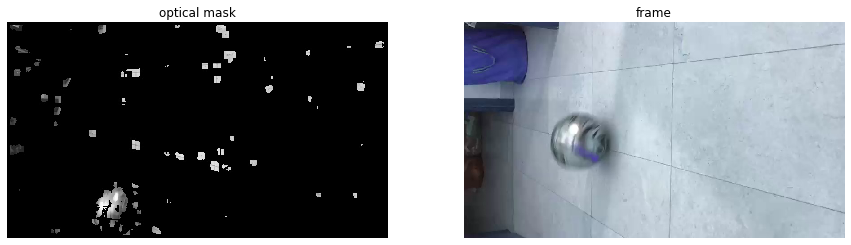

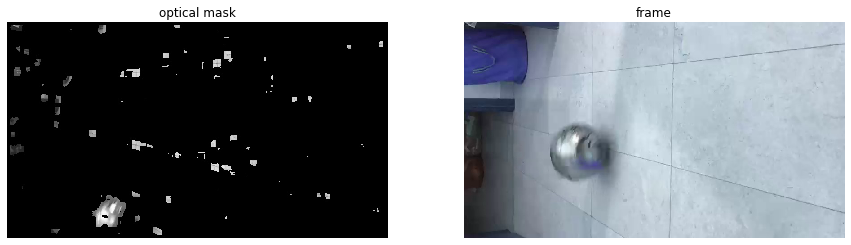

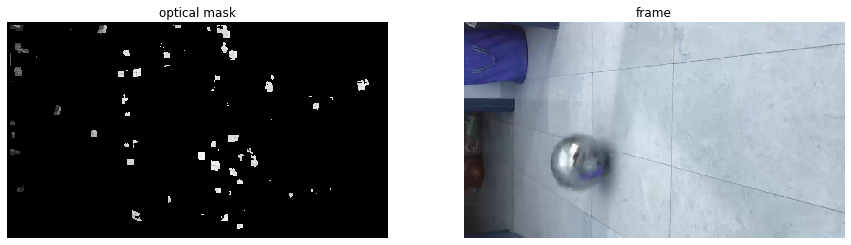

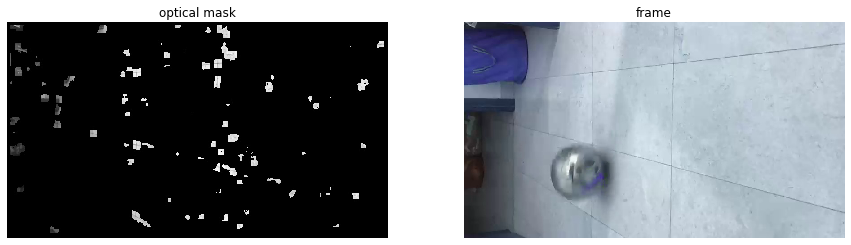

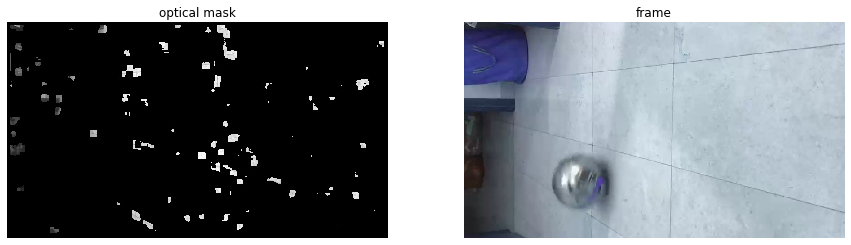

...

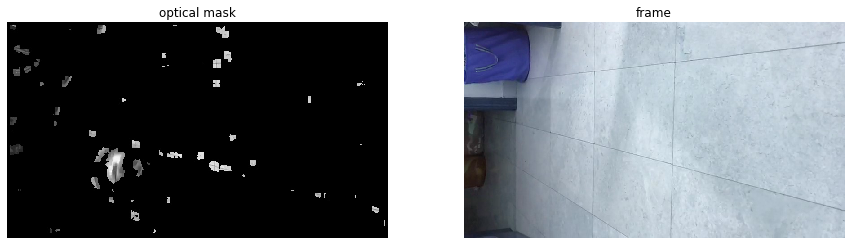

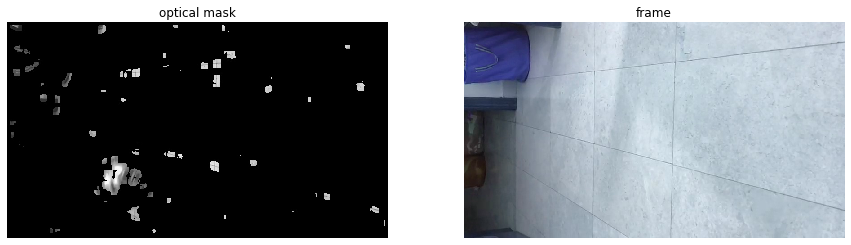

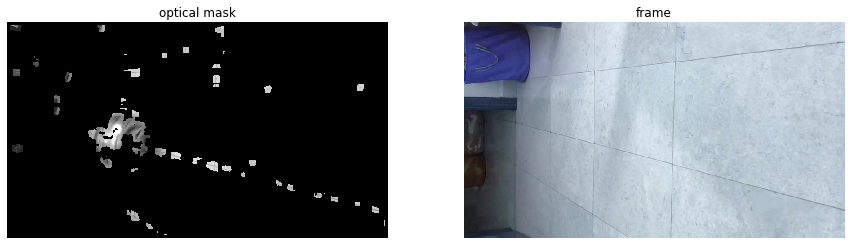

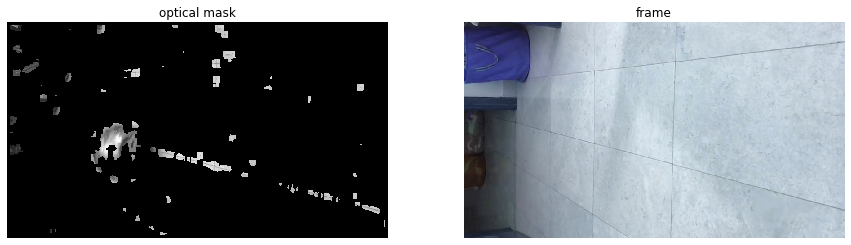

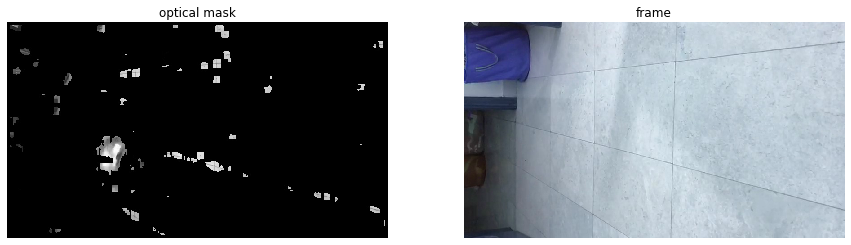

In [57]:
img_dir = './ball_vid2img/'
count = 1
for dirname in os.listdir(img_dir):
    fpath= os.path.join(img_dir,dirname)
    img = cv2.imread(fpath,0)
    p = 'image'+ str(count) + '.jpg'
    count+=1
    p_ = './ballo_vid2img/' + p
    img2 = cv2.imread(p_)
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.imshow(img,cmap='gray')
    plt.title('optical mask')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(img2)
    plt.title('frame')
    plt.axis('off')

In [ ]:
cap = cv2.VideoCapture('./ball_img2vid.mp4')

# params for ShiTomasi corner detection
feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

# Parameters for lucas kanade optical flow
lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Create some random colors
color = np.random.randint(0,255,(100,3))

# Take first frame and find corners in it
ret, old_frame = cap.read()
# old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)

old_gray = old_frame
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

# Create a mask image for drawing purposes
mask = np.zeros_like(old_frame)
count = 0
while(1):
    ret,frame = cap.read()
#     frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    frame_gray = frame
    # calculate optical flow
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    # Select good points
    good_new = p1[st==1]
    good_old = p0[st==1]

    # draw the tracks
    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (a,b),(c,d), color[i].tolist(), 2)
        frame = cv2.circle(frame,(a,b),5,color[i].tolist(),-1)
    img = cv2.add(frame,mask)

#     cv2.imshow('frame',img)
    count+=1
    cv2.imwrite("./tracks_ball/image"+str(count)+".jpg",img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

    # Now update the previous frame and previous points
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

cv2.destroyAllWindows()
cap.release()

# Visualising Tracks and Optical Masks for each frame

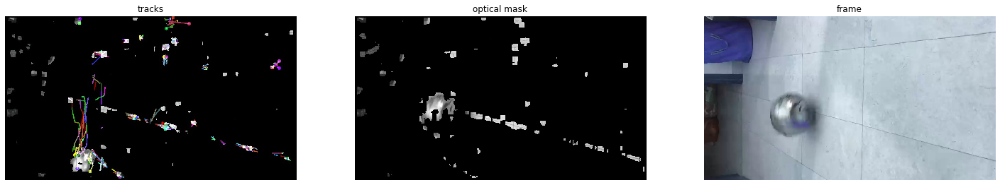

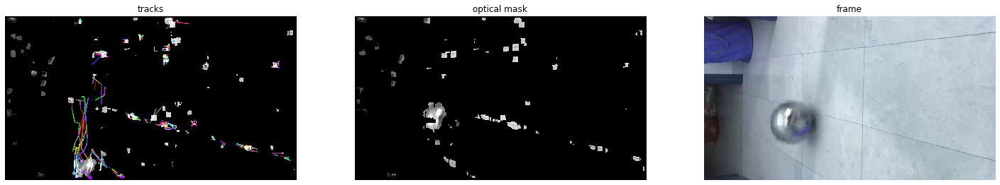

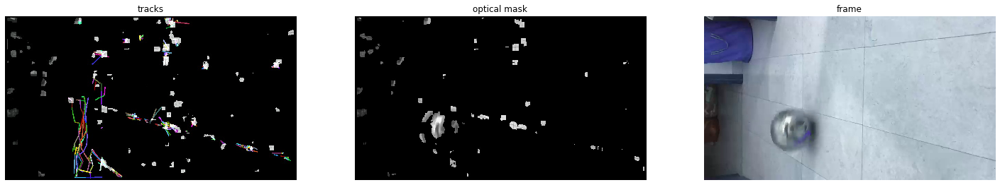

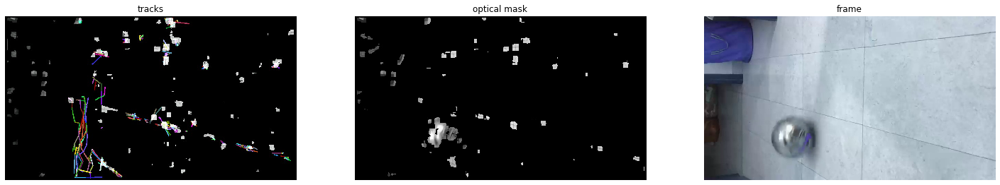

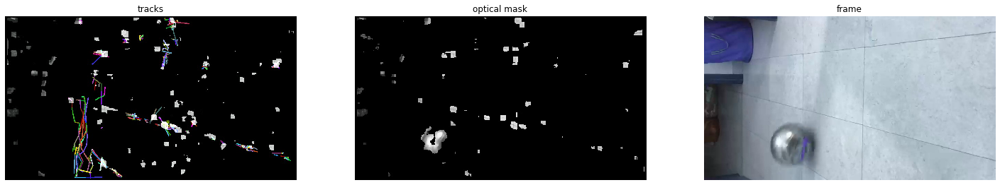

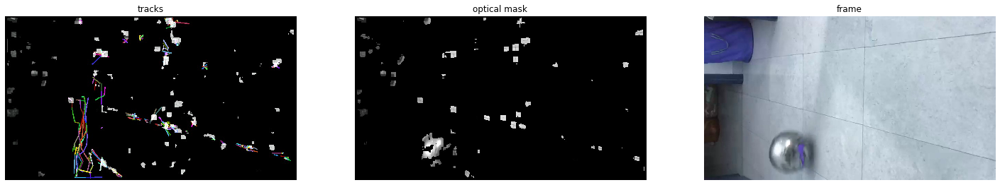

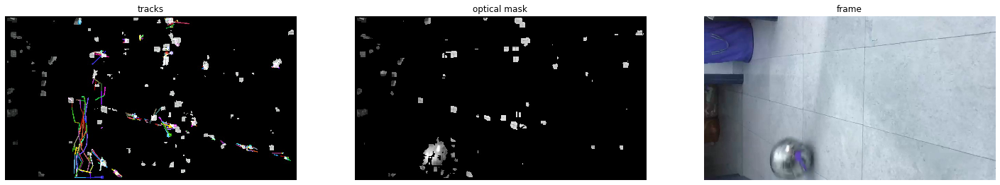

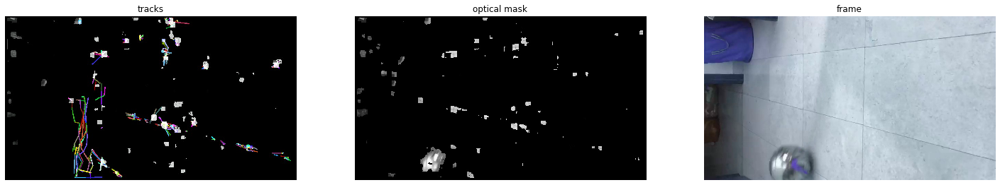

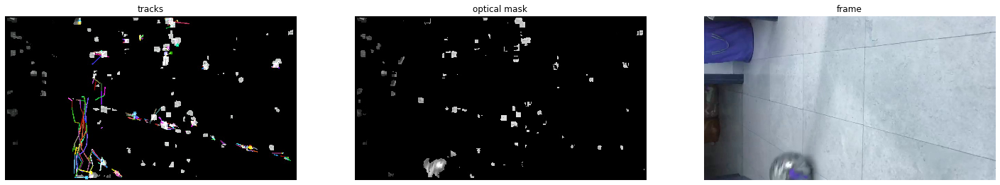

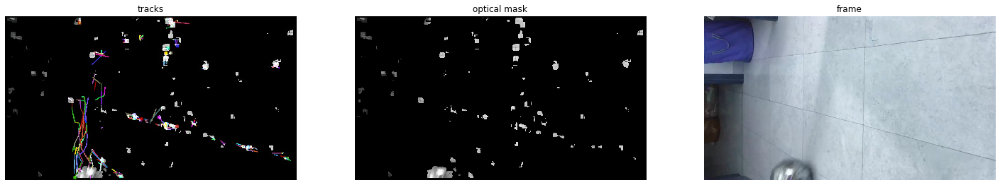

In [66]:
img_dir = './tracks_ball/'
count = 1
for dirname in os.listdir(img_dir):
    count+=1
    
    p = 'image'+ str(count) + '.jpg'
    p_ = './ballo_vid2img/' + p
    p__ = './ball_vid2img/' + p
    
    img2 = cv2.imread(p_)
    img1 = cv2.imread(p__)
    
    fpath= os.path.join(img_dir,dirname)
    img = cv2.imread(fpath)
    plt.figure(figsize=(25,25))
    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title('tracks')
    plt.axis('off')
    
    plt.subplot(1,3,2)
    plt.imshow(img1)
    plt.title('optical mask')
    plt.axis('off')
    
    plt.subplot(1,3,3)
    plt.imshow(img2)
    plt.title('frame')
    plt.axis('off')
    
    if count==11:
        break